In [1]:
!pip install opencv-python ultralytics


  Using cached opencv_python-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
  Using cached ultralytics-8.3.133-py3-none-any.whl.metadata (37 kB)
  Using cached py_cpuinfo-9.0.0-py3-none-any.whl.metadata (794 bytes)
  Using cached ultralytics_thop-2.0.14-py3-none-any.whl.metadata (9.4 kB)
Using cached opencv_python-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (63.0 MB)
Using cached ultralytics-8.3.133-py3-none-any.whl (1.0 MB)
Using cached ultralytics_thop-2.0.14-py3-none-any.whl (26 kB)
Using cached py_cpuinfo-9.0.0-py3-none-any.whl (22 kB)


In [2]:
pip install albumentations


  Using cached albumentations-2.0.6-py3-none-any.whl.metadata (43 kB)
  Using cached albucore-0.0.24-py3-none-any.whl.metadata (5.3 kB)
  Using cached opencv_python_headless-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
  Using cached stringzilla-3.12.5-cp311-cp311-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_28_x86_64.whl.metadata (80 kB)
  Using cached simsimd-6.2.1-cp311-cp311-manylinux_2_28_x86_64.whl.metadata (66 kB)
Using cached albumentations-2.0.6-py3-none-any.whl (332 kB)
Using cached albucore-0.0.24-py3-none-any.whl (15 kB)
Using cached opencv_python_headless-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (50.0 MB)
Using cached simsimd-6.2.1-cp311-cp311-manylinux_2_28_x86_64.whl (632 kB)
Using cached stringzilla-3.12.5-cp311-cp311-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_28_x86_64.whl (307 kB)
Note: you may need to restart the kernel to use updated packages.


In [3]:
import os # Import os Library
from ultralytics import YOLO # Import Yolo
import yaml # Import yaml 
import matplotlib.pyplot as plt # Import matplotlib to plot graphs
import glob # Import glob
import pandas as pd # Import pandas
import albumentations as A

In [26]:
"""Creates the important parameters and the dataset"""
base_path = os.path.abspath('./yolo_split')

transform = A.Compose([
    A.RandomRotate90(p=0.5),    
    A.Rotate(limit=45, p=0.5),  
    A.RandomSizedBBoxSafeCrop(width=640, height=640, p=0.5), 
    A.HorizontalFlip(p=0.5),  
    A.VerticalFlip(p=0.5),  
    A.RandomBrightnessContrast(p=0.2), 
    A.RandomScale(p=0.2),   
    A.Normalize(),        
])

# dataset created for the yolo model
dataset = {
    'train': os.path.join(base_path, 'train/images'),
    'val': os.path.join(base_path, 'val/images'),
    'test': os.path.join(base_path, 'test/images'),
    'nc': 1,
    'names': ['card'],
    'anchors': [60, 80, 100, 120, 150, 160]
}

# Create a yaml file from the following dataset
yaml_path = os.path.join(base_path, 'data.yaml')
with open(yaml_path, 'w') as f:
    yaml.dump(dataset, f)

In [12]:
"""Creates the yolo model and trains it"""
os.environ["MLFLOW_TRACKING_URI"] = "none" # Remove ml-flow since it is not within the directory
model = YOLO('yolov8s.pt') # Load the yolo model
results = model.train(data=yaml_path, epochs=500, imgsz=1024, batch=8, device=0, augment=True, conf=0.4, iou=0.5) # Trains the model


100%|██████████| 21.5M/21.5M [00:00<00:00, 50.1MB/s]

Ultralytics 8.3.133 🚀 Python-3.11.11 torch-2.4.1.post300 CUDA:0 (Tesla T4, 14918MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=0.4, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/sagemaker-user/yolo_split/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=500, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, int8=False, iou=0.5, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0,

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 346MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.4±0.5 ms, read: 141.1±10.7 MB/s, size: 277.4 KB)


train: Scanning /home/sagemaker-user/yolo_split/train/labels.cache... 225 images, 94 backgrounds, 0 corrupt: 100%|██████████| 225/225 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 134.7±26.1 MB/s, size: 259.2 KB)


val: Scanning /home/sagemaker-user/yolo_split/val/labels.cache... 45 images, 20 backgrounds, 0 corrupt: 100%|██████████| 45/45 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)


2025/05/14 01:59:53 INFO mlflow.bedrock: Enabled auto-tracing for Bedrock. Note that MLflow can only trace boto3 service clients that are created after this call. If you have already created one, please recreate the client by calling `boto3.client`.
2025/05/14 01:59:53 INFO mlflow.tracking.fluent: Autologging successfully enabled for boto3.
2025/05/14 01:59:53 INFO mlflow.tracking.fluent: Autologging successfully enabled for langchain.
2025/05/14 01:59:53 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.


MLflow: logging run_id(d86ef1963e9e4c48b3d16e021600f3ec) to none
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri none'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 1024 train, 1024 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 500 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/500      4.68G     0.8184      9.869      1.195          2       1024: 100%|██████████| 29/29 [00:09<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.15it/s]

                   all         45         30      0.253      0.133      0.164      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/500      5.63G      0.607      2.995      1.055          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.12it/s]

                   all         45         30          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/500      5.63G     0.7668      1.878      1.175          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.57it/s]

                   all         45         30      0.311        0.6      0.301      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/500      5.63G     0.7823      1.643      1.151          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.58it/s]

                   all         45         30        0.5        0.3      0.358      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/500      5.63G     0.7586      1.636      1.116          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.48it/s]

                   all         45         30      0.149      0.467      0.145     0.0732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/500      5.63G     0.7775       1.48      1.116          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.36it/s]

                   all         45         30      0.415      0.433      0.327       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/500      5.63G      0.667      1.346      1.073          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.52it/s]

                   all         45         30      0.178      0.267      0.125     0.0935



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/500      5.63G      0.675      1.281      1.083          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.72it/s]

                   all         45         30      0.435      0.667      0.512      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/500      5.63G     0.6407      1.408      1.013          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.80it/s]

                   all         45         30      0.368      0.467      0.294      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/500      5.63G     0.6405      1.389      1.025          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.89it/s]

                   all         45         30      0.143     0.0333     0.0805     0.0805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/500      5.63G     0.6972      1.215       1.09          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.42it/s]

                   all         45         30      0.333      0.867      0.435      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/500      5.63G     0.6625      1.229      1.056          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.54it/s]

                   all         45         30      0.466      0.733       0.55      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/500      5.63G     0.5897      1.209     0.9862          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.64it/s]

                   all         45         30      0.591      0.434      0.467      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/500      5.63G     0.5785      1.116     0.9849          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.56it/s]

                   all         45         30      0.425        0.7      0.483      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/500      5.63G     0.5609      1.121      0.999          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.50it/s]

                   all         45         30      0.594      0.467      0.529      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/500      5.63G     0.5728      1.087      1.028          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.51it/s]

                   all         45         30      0.408      0.967      0.625       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/500      5.63G     0.5257       1.08     0.9644          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.71it/s]

                   all         45         30      0.404        0.7      0.397      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/500      5.63G     0.5739      1.087       1.03          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.47it/s]

                   all         45         30      0.393        0.8      0.394      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/500      5.63G     0.5106      1.091     0.9761          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.47it/s]

                   all         45         30      0.386      0.733      0.445        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/500      5.63G     0.5168      1.097     0.9837          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.77it/s]

                   all         45         30      0.577      0.533      0.477      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/500      5.63G     0.5625      1.115     0.9991          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.59it/s]

                   all         45         30      0.393        0.8      0.506      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/500      5.63G     0.5146       1.11     0.9863          4       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.64it/s]

                   all         45         30      0.576      0.633      0.544      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/500      5.63G     0.5317      1.098     0.9867          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.72it/s]

                   all         45         30      0.516      0.533       0.51       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/500      5.63G     0.4871      1.144     0.9324          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.37it/s]

                   all         45         30      0.384      0.933      0.445       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/500      5.63G      0.516      1.072     0.9511          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.04it/s]

                   all         45         30        0.6        0.3       0.45      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/500      5.63G     0.5198      1.082     0.9609          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.59it/s]

                   all         45         30      0.427        0.8       0.54      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/500      5.63G     0.5152      1.053     0.9522          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.62it/s]

                   all         45         30      0.377      0.867      0.507      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/500      5.63G     0.5295      1.017     0.9873          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.41it/s]

                   all         45         30      0.476      0.633      0.528      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/500      5.63G     0.5313      1.049      0.953          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.69it/s]

                   all         45         30      0.397      0.767       0.52      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/500      5.63G     0.4624      1.156     0.9109          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.41it/s]

                   all         45         30      0.417      0.833       0.57      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/500      5.63G     0.4884       1.19     0.9422          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.74it/s]

                   all         45         30      0.565      0.433       0.45      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/500      5.63G      0.511      1.004     0.9596          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.60it/s]

                   all         45         30      0.413      0.633      0.489      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/500      5.63G      0.529     0.9959     0.9729          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.58it/s]

                   all         45         30      0.477        0.7      0.565      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/500      5.63G     0.5083      1.131     0.9148          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.52it/s]

                   all         45         30      0.441      0.867      0.572      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/500      5.63G     0.4911      1.052     0.9483          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.49it/s]

                   all         45         30      0.361      0.867      0.387      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/500      5.63G     0.4986      1.034     0.9527          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.48it/s]

                   all         45         30      0.394      0.867      0.483      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/500      5.64G     0.4541      1.005      0.903          5       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.44it/s]

                   all         45         30      0.496      0.567      0.476      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/500      5.64G     0.4516      1.078     0.8926          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.35it/s]

                   all         45         30      0.443      0.533      0.452      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/500      5.64G     0.4652      1.205     0.9153          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.90it/s]

                   all         45         30      0.638        0.5      0.513      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/500      5.64G     0.4686      1.008     0.9116          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.76it/s]

                   all         45         30      0.622      0.467       0.51      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/500      5.64G     0.4741     0.9798     0.9343          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.73it/s]

                   all         45         30      0.567      0.567      0.474       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/500      5.64G     0.4788     0.9619     0.9434          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.61it/s]

                   all         45         30      0.526        0.6      0.496      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/500      5.64G     0.4419     0.9966     0.9222          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.48it/s]

                   all         45         30      0.407      0.733       0.51       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/500      5.64G     0.4523     0.9479     0.9138          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.74it/s]

                   all         45         30      0.484      0.567      0.516      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/500      5.64G     0.4588      1.029     0.9265          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.66it/s]

                   all         45         30      0.667      0.333      0.476      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/500      5.64G     0.4578      1.063     0.9494          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.71it/s]

                   all         45         30      0.382        0.8       0.39      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/500      5.64G     0.4592      1.029     0.9088          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.56it/s]

                   all         45         30      0.386        0.9      0.458       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/500      5.64G     0.4811      1.021     0.9281          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.53it/s]

                   all         45         30       0.38      0.867      0.549      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/500      5.64G     0.4378      1.031     0.9263          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.19it/s]

                   all         45         30          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/500      5.64G     0.4811     0.9856     0.9503          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.70it/s]

                   all         45         30      0.528      0.633      0.498      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/500      5.64G     0.4413     0.9908      0.915          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.29it/s]

                   all         45         30      0.411      0.767      0.442      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/500      5.64G     0.4395      1.027     0.9288          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.80it/s]

                   all         45         30      0.404      0.633      0.351      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/500      5.64G     0.4372     0.9748     0.9355          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.59it/s]

                   all         45         30      0.381      0.843      0.442      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/500      5.64G     0.4441     0.9724     0.9342          5       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.62it/s]

                   all         45         30        0.5        0.7      0.577      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/500      5.64G     0.4548     0.9453     0.9109          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.51it/s]

                   all         45         30      0.469      0.767      0.502      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/500      5.64G     0.4172       1.25     0.8835          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.16it/s]

                   all         45         30      0.507      0.753      0.561      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/500      5.64G     0.4418      0.892     0.9342          4       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.77it/s]

                   all         45         30      0.481      0.433      0.446      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/500      5.64G     0.4184     0.9411     0.8951          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.37it/s]

                   all         45         30       0.49      0.833      0.484      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/500      5.64G     0.4473     0.9206     0.9169          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.58it/s]

                   all         45         30      0.468      0.733       0.41      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/500      5.64G     0.4121     0.8472     0.8843          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.69it/s]

                   all         45         30      0.587      0.633      0.537      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/500      5.64G     0.4438     0.9456     0.9255          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.36it/s]

                   all         45         30       0.53        0.5      0.477      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/500      5.64G     0.4534      0.912     0.9392          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.05it/s]

                   all         45         30      0.439      0.833      0.589      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/500      5.64G     0.4225     0.8606      0.921          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.34it/s]

                   all         45         30      0.616      0.642      0.667      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/500      5.64G     0.4279     0.9877     0.8978          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.88it/s]

                   all         45         30      0.727      0.533      0.599       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/500      5.64G     0.4788      1.011     0.9249          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.63it/s]

                   all         45         30      0.607      0.767      0.663       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/500      5.64G     0.4297     0.8807     0.9166          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.50it/s]

                   all         45         30      0.529      0.712      0.615      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/500      5.64G     0.4748      0.961     0.9751          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.47it/s]

                   all         45         30        0.6        0.8      0.614       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/500      5.64G     0.4678     0.8567     0.9577          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.60it/s]

                   all         45         30       0.55      0.733      0.563      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/500      5.64G       0.45     0.8999      0.948          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.67it/s]

                   all         45         30      0.538        0.7       0.49      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/500      5.64G     0.4687     0.9026     0.9242          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.09it/s]

                   all         45         30      0.619        0.7      0.658      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/500      5.64G     0.4296     0.8911     0.9174          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.82it/s]

                   all         45         30       0.64       0.71      0.668      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/500      5.64G     0.4379     0.8382     0.9324          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.67it/s]

                   all         45         30      0.697        0.6      0.664      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/500      5.64G     0.4702      0.924     0.9266          5       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.56it/s]

                   all         45         30      0.557      0.867      0.691      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/500      5.64G     0.4572     0.9717     0.9187          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.75it/s]

                   all         45         30      0.582      0.882      0.693      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/500      5.64G      0.403      1.076      0.887          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.63it/s]

                   all         45         30      0.636        0.7      0.703      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/500      5.64G     0.4046     0.8591     0.9208          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.77it/s]

                   all         45         30      0.669      0.667      0.639      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/500      5.64G      0.453     0.9071     0.9287          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.22it/s]

                   all         45         30      0.499      0.767      0.669      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/500      5.64G     0.4108     0.9089     0.9189          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.63it/s]

                   all         45         30      0.541        0.9      0.712      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/500      5.64G     0.4251      0.879     0.8988          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.67it/s]

                   all         45         30      0.571        0.8      0.685      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/500      5.64G     0.3907      1.069     0.8735          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.72it/s]

                   all         45         30      0.639      0.767      0.636      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/500      5.64G     0.4422     0.8916     0.9291          4       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.67it/s]

                   all         45         30      0.583        0.7      0.628      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/500      5.64G     0.4199     0.8568     0.9436          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.51it/s]

                   all         45         30       0.69        0.7      0.712      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/500      5.64G     0.4214       1.04     0.8908          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.52it/s]

                   all         45         30      0.549      0.933      0.647      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/500      5.64G     0.4544     0.8793     0.9179          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.61it/s]

                   all         45         30      0.605      0.867      0.717       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/500      5.64G     0.3956     0.7836     0.9043          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.65it/s]

                   all         45         30      0.589      0.967      0.714       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/500      5.64G     0.4249      1.149     0.8819          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.59it/s]

                   all         45         30      0.605      0.833      0.652      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/500      5.64G     0.4404      1.164     0.8907          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.75it/s]

                   all         45         30      0.655      0.633      0.673       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/500      5.64G      0.462     0.8973     0.9372          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.84it/s]

                   all         45         30      0.668      0.867      0.788      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/500      5.64G     0.4034      1.119       0.89          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.60it/s]

                   all         45         30      0.673        0.8      0.819       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/500      5.64G     0.3927      0.834     0.9051          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.51it/s]

                   all         45         30      0.673        0.8       0.76      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/500      5.64G     0.4099     0.8403     0.9163          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.44it/s]

                   all         45         30      0.588        0.8      0.625       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/500      5.64G     0.4082     0.8588     0.9059          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.70it/s]

                   all         45         30      0.571      0.667      0.573      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/500      5.64G     0.3981     0.9859     0.8849          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.49it/s]

                   all         45         30       0.52      0.867      0.614      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/500      5.64G     0.4395     0.8257     0.9429          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.46it/s]

                   all         45         30      0.498      0.892      0.584      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/500      5.64G     0.4403     0.8527     0.9045          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.75it/s]

                   all         45         30      0.561        0.6      0.565       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/500      5.64G     0.4154     0.8082     0.9042          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.54it/s]

                   all         45         30       0.57        0.7      0.575      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/500      5.64G     0.4259     0.7966     0.8964          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.51it/s]

                   all         45         30      0.511      0.802      0.592      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/500      5.64G      0.419     0.8354     0.9178          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.56it/s]

                   all         45         30      0.556      0.836      0.646      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/500      5.64G     0.4288     0.7907     0.8958          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.61it/s]

                   all         45         30      0.577      0.727      0.668      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/500      5.64G     0.4038      1.007     0.8792          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.64it/s]

                   all         45         30      0.556      0.833      0.662       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/500      5.64G     0.4074     0.7524     0.9006          4       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.61it/s]

                   all         45         30        0.7      0.733      0.678      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/500      5.64G     0.4071     0.7699     0.8982          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.56it/s]

                   all         45         30      0.737      0.667      0.693      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/500      5.64G      0.417     0.7827     0.8722          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.70it/s]

                   all         45         30      0.525        0.7      0.624      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/500      5.64G     0.4184     0.8179     0.9117          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.63it/s]

                   all         45         30      0.595      0.833      0.669      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/500      5.64G     0.3849      1.037     0.8941          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.50it/s]

                   all         45         30      0.578        0.8      0.656      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/500      5.64G     0.4448     0.8686     0.9098          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.61it/s]

                   all         45         30      0.513      0.933      0.593      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/500      5.64G     0.4124     0.7625     0.9185          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.70it/s]

                   all         45         30      0.523      0.767      0.599      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/500      5.64G     0.4023     0.7721      0.902          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.55it/s]

                   all         45         30      0.591      0.865      0.651      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/500      5.64G     0.4029     0.8516     0.9169          5       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.72it/s]

                   all         45         30      0.677        0.7      0.644        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/500      5.64G      0.399     0.8743     0.8744          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.53it/s]

                   all         45         30      0.491      0.838      0.546      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/500      5.64G     0.4352     0.8057     0.9232          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.60it/s]

                   all         45         30      0.605      0.867      0.719      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/500      5.64G     0.4167     0.8063      0.918          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.38it/s]

                   all         45         30      0.565      0.867      0.643      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/500      5.64G     0.4091     0.7347     0.9103          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.54it/s]

                   all         45         30      0.558        0.8      0.585      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/500      5.64G     0.4107     0.7485     0.8988          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.73it/s]

                   all         45         30        0.6        0.7      0.602       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/500      5.64G     0.4367     0.7566     0.9139          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.49it/s]

                   all         45         30      0.515      0.849      0.603      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/500      5.64G     0.4084     0.7751     0.9073          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.56it/s]

                   all         45         30      0.558      0.799      0.633      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/500      5.64G     0.4224     0.8198     0.8868          5       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.72it/s]

                   all         45         30      0.636        0.7      0.662       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/500      5.64G     0.4091     0.8186     0.9096          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.78it/s]

                   all         45         30      0.507      0.567      0.513      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/500      5.64G     0.3844     0.8085     0.8634          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.89it/s]

                   all         45         30      0.654      0.567      0.599      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/500      5.64G     0.4089     0.7673     0.8999          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.51it/s]

                   all         45         30      0.595      0.733      0.651      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/500      5.64G     0.3956     0.9725     0.8769          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.47it/s]

                   all         45         30      0.548      0.767      0.631      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/500      5.64G     0.4026      1.019     0.9063          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.44it/s]

                   all         45         30       0.63      0.667      0.681      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/500      5.64G     0.4129     0.7758     0.9253          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.28it/s]

                   all         45         30      0.574        0.9      0.727      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/500      5.64G     0.4197      0.679     0.8814          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.43it/s]

                   all         45         30      0.717      0.767      0.712      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/500      5.64G     0.3805     0.7078     0.9074          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.64it/s]

                   all         45         30      0.691      0.767      0.742      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/500      5.64G      0.396     0.7856     0.9087          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.75it/s]

                   all         45         30      0.666      0.767      0.726      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/500      5.64G     0.4169     0.8148     0.8956          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.71it/s]

                   all         45         30      0.549      0.867      0.618      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/500      5.64G     0.4145     0.7174     0.9086          4       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.48it/s]

                   all         45         30      0.691      0.767      0.644        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/500      5.64G     0.4263     0.7657     0.9017          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.04it/s]

                   all         45         30      0.615      0.533       0.58      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/500      5.64G      0.384     0.7387     0.9114          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.61it/s]

                   all         45         30      0.652        0.5      0.549      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/500      5.64G     0.3593     0.8153     0.8722          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.60it/s]

                   all         45         30      0.626      0.867      0.719      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/500      5.64G     0.3978     0.7643     0.9092          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.59it/s]

                   all         45         30      0.556      0.833       0.61      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/500      5.64G     0.3845     0.6759     0.9036          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.74it/s]

                   all         45         30        0.6        0.8      0.656       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/500      5.64G     0.3913     0.7762     0.8987          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.81it/s]

                   all         45         30      0.516      0.533      0.525       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/500      5.64G      0.362      0.782     0.8509          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.65it/s]

                   all         45         30      0.532      0.833      0.597      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/500      5.64G     0.3924     0.7468     0.9169          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.70it/s]

                   all         45         30      0.531      0.867      0.544      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/500      5.64G     0.3969     0.6666     0.9071          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.83it/s]

                   all         45         30      0.556      0.667      0.615      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/500      5.64G     0.3978     0.7934     0.8987          5       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.85it/s]

                   all         45         30      0.594      0.633      0.622      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/500      5.64G     0.3835     0.7534     0.8737          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.84it/s]

                   all         45         30      0.568        0.7      0.607      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/500      5.64G     0.3582     0.7057      0.873          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.73it/s]

                   all         45         30      0.641      0.833      0.705      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/500      5.64G     0.3754     0.7241     0.8809          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.88it/s]

                   all         45         30      0.622      0.767      0.679      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/500      5.64G     0.4256     0.7626     0.9031          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.67it/s]

                   all         45         30      0.652      0.867      0.733      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/500      5.64G     0.3766     0.9236     0.8753          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.69it/s]

                   all         45         30      0.531      0.867      0.672      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/500      5.64G     0.3945      1.035     0.8709          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.59it/s]

                   all         45         30      0.564      0.733      0.594      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/500      5.64G     0.3889     0.9601     0.8699          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.53it/s]

                   all         45         30      0.617      0.767      0.647      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/500      5.64G     0.3981     0.7702     0.8989          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.55it/s]

                   all         45         30       0.62      0.733      0.663      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/500      5.64G     0.3954     0.6881     0.8895          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.52it/s]

                   all         45         30      0.585        0.8      0.622      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/500      5.64G     0.3805     0.7205     0.8941          5       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.61it/s]

                   all         45         30      0.663        0.7      0.687       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/500      5.64G     0.4045      0.735     0.9106          5       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.81it/s]

                   all         45         30      0.658      0.641       0.66      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/500      5.64G     0.3909     0.7318     0.9001          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.73it/s]

                   all         45         30      0.629      0.733      0.682      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/500      5.64G     0.3821     0.7799     0.9213          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.42it/s]

                   all         45         30      0.605      0.767      0.717      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/500      5.64G      0.408     0.7911     0.9049          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.78it/s]

                   all         45         30      0.511      0.767      0.573      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/500      5.64G     0.4084     0.7282     0.8733          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.64it/s]

                   all         45         30      0.491        0.8      0.652      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/500      5.64G     0.4107     0.7036     0.8983          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.57it/s]

                   all         45         30      0.521      0.833      0.668      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/500      5.64G      0.369     0.8983     0.8597          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.86it/s]

                   all         45         30      0.665        0.5      0.551      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/500      5.64G     0.3951     0.7512     0.9036          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.81it/s]

                   all         45         30      0.564        0.7      0.622      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/500      5.64G     0.3613      0.691     0.8608          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.42it/s]

                   all         45         30      0.632      0.688      0.717      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/500      5.64G     0.3913     0.7191     0.8813          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.63it/s]

                   all         45         30      0.608      0.767      0.683      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/500      5.64G      0.398     0.7639     0.8944          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.82it/s]

                   all         45         30        0.6        0.7      0.641      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/500      5.64G     0.3832     0.7553      0.888          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.68it/s]

                   all         45         30      0.659       0.71      0.706      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/500      5.64G     0.3835     0.7293     0.8937          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.63it/s]

                   all         45         30      0.539      0.933      0.716      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/500      5.64G      0.358     0.6454     0.8856          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.63it/s]

                   all         45         30      0.578        0.8      0.655      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/500      5.64G     0.3756       0.67     0.9039          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.39it/s]

                   all         45         30       0.59      0.767      0.753      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/500      5.64G     0.3537     0.7014     0.8742          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.75it/s]

                   all         45         30      0.825      0.567      0.717      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/500      5.64G     0.3838     0.6936     0.8697          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.42it/s]

                   all         45         30      0.724      0.612      0.675      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/500      5.64G     0.3839     0.6644     0.8908          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.47it/s]

                   all         45         30      0.536      0.767      0.595      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/500      5.64G     0.3708     0.6286     0.8968          5       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.55it/s]

                   all         45         30      0.512      0.433      0.472      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/500      5.64G     0.3682     0.6444     0.8545          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.57it/s]

                   all         45         30      0.514      0.633      0.503      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/500      5.64G     0.3868     0.6685     0.8904          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.51it/s]

                   all         45         30      0.525      0.933      0.613      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/500      5.64G     0.3751     0.7673     0.8789          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.60it/s]

                   all         45         30      0.519      0.933      0.599      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/500      5.64G     0.3838     0.7101     0.8976          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.57it/s]

                   all         45         30      0.525      0.867      0.714      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/500      5.64G       0.39     0.7095     0.8942          4       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.78it/s]

                   all         45         30      0.595      0.633      0.674      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/500      5.64G     0.3936      0.681      0.916          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.63it/s]

                   all         45         30      0.588      0.733      0.662      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/500      5.64G      0.401     0.6685     0.9081          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.39it/s]

                   all         45         30      0.558        0.8      0.677      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/500      5.64G     0.3667      0.699     0.8818          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.68it/s]

                   all         45         30      0.581      0.833      0.753      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/500      5.64G     0.3605      1.013     0.8413          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.35it/s]

                   all         45         30      0.595      0.767      0.668       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/500      5.64G     0.3811     0.6858     0.8835          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.43it/s]

                   all         45         30      0.649      0.733      0.609      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/500      5.64G     0.3728     0.6935     0.8755          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.74it/s]

                   all         45         30      0.675      0.762      0.664      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/500      5.64G     0.3759     0.7901     0.8727          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.54it/s]

                   all         45         30      0.522        0.8        0.6      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/500      5.64G     0.3649     0.6971     0.8879          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.52it/s]

                   all         45         30      0.601      0.633      0.604      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/500      5.64G     0.3962     0.6422      0.894          3       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.89it/s]

                   all         45         30      0.677        0.7      0.633      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/500      5.64G     0.3913     0.6912     0.9027          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.72it/s]

                   all         45         30      0.556      0.833      0.653      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/500      5.64G     0.3616     0.6554     0.8872          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.60it/s]

                   all         45         30      0.604      0.667      0.591      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/500      5.64G      0.344     0.6309     0.8854          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.61it/s]

                   all         45         30      0.558        0.8      0.626      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/500      5.64G     0.3683     0.8574     0.8601          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.64it/s]

                   all         45         30      0.558        0.7      0.612      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/500      5.64G     0.3577     0.9397     0.8588          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.57it/s]

                   all         45         30      0.589        0.7      0.599      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/500      5.64G     0.3559     0.6547     0.8736          2       1024: 100%|██████████| 29/29 [00:08<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.53it/s]

                   all         45         30      0.548      0.767      0.608      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/500      5.64G     0.3509     0.6798     0.8515          0       1024: 100%|██████████| 29/29 [00:08<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.62it/s]

                   all         45         30       0.54        0.9      0.609       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/500      5.64G     0.3607     0.7053     0.8884          1       1024: 100%|██████████| 29/29 [00:08<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.60it/s]

                   all         45         30      0.655      0.634      0.654      0.579
EarlyStopping: Training stopped early as no improvement observed in last 100 epochs. Best results observed at epoch 89, best model saved as best.pt.
To update EarlyStopping(patience=100) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



189 epochs completed in 0.479 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.133 🚀 Python-3.11.11 torch-2.4.1.post300 CUDA:0 (Tesla T4, 14918MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.18it/s]


                   all         45         30      0.623      0.867      0.742      0.691
Speed: 0.5ms preprocess, 53.3ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train
MLflow: results logged to none
MLflow: disable with 'yolo settings mlflow=False'


In [22]:
model = YOLO("runs/detect/train/weights/best.pt")

transform = A.Compose([
    A.RandomRotate90(p=0.5),
    A.Rotate(limit=30, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.ColorJitter(p=0.2),
    A.Normalize()  # Normalize images
])

# Training settings (continue training with augmentation)
results = model.train(
    data="yolo_split/data.yaml",  # Path to your data YAML file
    epochs=50,                    # Train for additional 50 epochs (adjust based on the results)
    imgsz=1024,                   # Image size
    batch=16,                     # Batch size (adjust based on GPU memory)
    device=0,                     # GPU device
    augment=True,                 # Enable augmentation
    conf=0.5,                     # Confidence threshold for detection
    iou=0.3                       # NMS IoU threshold
)

Ultralytics 8.3.133 🚀 Python-3.11.11 torch-2.4.1.post300 CUDA:0 (Tesla T4, 14918MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=0.5, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=yolo_split/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, int8=False, iou=0.3, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=runs/detect/train/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12

train: Scanning /home/sagemaker-user/yolo_split/train/labels.cache... 225 images, 94 backgrounds, 0 corrupt: 100%|██████████| 225/225 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 148.5±7.1 MB/s, size: 259.2 KB)


val: Scanning /home/sagemaker-user/yolo_split/val/labels.cache... 45 images, 20 backgrounds, 0 corrupt: 100%|██████████| 45/45 [00:00<?, ?it/s]


Plotting labels to runs/detect/train5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)


2025/05/14 04:42:37 INFO mlflow.tracking.fluent: Experiment with name '/Shared/Ultralytics' does not exist. Creating a new experiment.
2025/05/14 04:42:37 INFO mlflow.bedrock: Enabled auto-tracing for Bedrock. Note that MLflow can only trace boto3 service clients that are created after this call. If you have already created one, please recreate the client by calling `boto3.client`.
2025/05/14 04:42:37 INFO mlflow.tracking.fluent: Autologging successfully enabled for boto3.
2025/05/14 04:42:37 INFO mlflow.tracking.fluent: Autologging successfully enabled for langchain.
2025/05/14 04:42:38 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.


MLflow: logging run_id(f9ba3f60f5f34f70b5b4c52dc369c3a8) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 1024 train, 1024 val
Using 4 dataloader workers
Logging results to runs/detect/train5
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       8.5G     0.3801     0.8425     0.9032          1       1024: 100%|██████████| 15/15 [00:09<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]

                   all         45         30      0.595      0.733      0.647      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      8.55G     0.3452       1.05     0.8432          0       1024: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]

                   all         45         30      0.568        0.7      0.595      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      8.61G     0.4003     0.7707     0.8807          6       1024: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.38it/s]

                   all         45         30        0.5        0.6      0.476      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      8.57G     0.4048     0.8246     0.8986          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.50it/s]

                   all         45         30      0.657      0.767      0.673      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      8.57G     0.3961     0.7473     0.9046          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.35it/s]

                   all         45         30      0.622      0.767      0.713      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      8.57G     0.4199     0.7661     0.9071          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]

                   all         45         30      0.553      0.867      0.595      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       8.6G     0.4087     0.7527      0.913          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]

                   all         45         30      0.618      0.867      0.623      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      8.62G     0.4105     0.7949     0.8812          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.38it/s]

                   all         45         30      0.554        0.9      0.683      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      8.57G     0.4318     0.8284     0.9271          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]

                   all         45         30      0.659      0.867      0.722      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      8.61G     0.4388     0.8312     0.9239          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.45it/s]

                   all         45         30      0.629        0.7      0.616      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50       8.6G     0.4054      0.899     0.8517          0       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.36it/s]

                   all         45         30      0.565      0.735      0.595      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      8.62G     0.4526     0.8143      0.935          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.35it/s]

                   all         45         30      0.743      0.767       0.74      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      8.58G     0.7038       1.24      1.015          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]

                   all         45         30      0.551        0.9      0.719      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50       8.6G     0.3871      1.142     0.8519          0       1024: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.07it/s]

                   all         45         30      0.656      0.698      0.665      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       8.6G     0.4123     0.7777     0.9134          4       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.26it/s]

                   all         45         30      0.682        0.5      0.604      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      8.62G     0.4099     0.7737     0.9074          3       1024: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]

                   all         45         30      0.564      0.833      0.639       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      8.57G     0.4168     0.8142      0.902          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.40it/s]

                   all         45         30      0.556      0.833      0.571       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       8.6G     0.4325     0.7385     0.9463          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.38it/s]

                   all         45         30      0.581        0.6      0.537      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      8.61G     0.4081     0.7769     0.8999          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]

                   all         45         30      0.535        0.8      0.622      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      8.61G     0.3933     0.7222     0.8881          3       1024: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]

                   all         45         30      0.515      0.815      0.557      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      8.59G     0.4065     0.7974     0.8994          7       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.31it/s]

                   all         45         30      0.523      0.767      0.542      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      8.61G     0.3906     0.7344     0.9082          3       1024: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.41it/s]

                   all         45         30      0.582      0.733      0.552      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      8.61G      0.413     0.7466     0.9067          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.26it/s]

                   all         45         30       0.58      0.691      0.588      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      8.62G     0.3745      1.257     0.8468          0       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.32it/s]

                   all         45         30      0.629      0.733      0.672      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      8.57G     0.4148     0.7224     0.8914          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         45         30      0.595      0.833      0.672      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      8.61G      0.404     0.7694     0.9061          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.26it/s]

                   all         45         30      0.675      0.833      0.746      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50       8.6G     0.3872     0.6989     0.8926          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.37it/s]

                   all         45         30      0.657      0.767      0.716      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      8.62G     0.3892     0.6508     0.9028          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.41it/s]

                   all         45         30      0.692        0.6      0.621      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      8.59G     0.3791      0.639     0.8886          4       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.36it/s]

                   all         45         30      0.643        0.6      0.573      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      8.61G     0.3804     0.8181      0.899          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.77it/s]

                   all         45         30      0.564      0.567      0.501      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      8.59G     0.3675     0.6501     0.9043          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]

                   all         45         30      0.571      0.767      0.595      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      8.61G     0.3637     0.7778      0.832          0       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.15it/s]

                   all         45         30      0.556      0.933      0.669      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      8.57G      0.398     0.7293     0.8707          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]

                   all         45         30       0.56      0.933      0.663      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      8.61G     0.3788     0.6691     0.8977          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]

                   all         45         30      0.585        0.8      0.599      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       8.6G     0.3702     0.6711     0.8829          3       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         45         30      0.565      0.867       0.64      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      8.62G     0.3841     0.6436     0.8918          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         45         30      0.572      0.933      0.715      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      8.57G     0.3409     0.6193     0.8703          2       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]

                   all         45         30      0.617      0.933      0.677      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50       8.6G     0.4117      0.735     0.9011          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.09it/s]

                   all         45         30      0.607        0.8       0.61      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      8.59G     0.3557     0.6076     0.8882          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         45         30      0.649      0.833      0.686      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      8.61G     0.3377     0.6269     0.8808          3       1024: 100%|██████████| 15/15 [00:07<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]

                   all         45         30        0.6        0.9      0.674      0.634


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      8.57G     0.3787     0.6504     0.8743          1       1024: 100%|██████████| 15/15 [00:09<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]

                   all         45         30      0.562        0.9      0.635      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       8.6G     0.3508     0.6023     0.8482          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.26it/s]

                   all         45         30      0.646        0.8      0.627      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       8.6G     0.3382     0.6213     0.8457          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.31it/s]

                   all         45         30      0.643        0.8      0.665      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      8.62G     0.3303     0.5524     0.8854          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.41it/s]

                   all         45         30      0.592        0.9      0.684      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      8.57G      0.314     0.5769     0.8122          0       1024: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]

                   all         45         30      0.605      0.867      0.691      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      8.61G     0.3044     0.9425     0.8019          0       1024: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         45         30      0.595      0.833      0.704      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50       8.6G     0.3044     0.9226     0.8016          0       1024: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.33it/s]

                   all         45         30      0.595      0.833      0.705      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      8.63G     0.3139     0.6536     0.8163          0       1024: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.38it/s]

                   all         45         30      0.659      0.733      0.668      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      8.57G     0.2826     0.5999     0.7949          0       1024: 100%|██████████| 15/15 [00:07<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.43it/s]

                   all         45         30      0.691      0.745      0.665      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50       8.6G     0.3181      0.546     0.8521          1       1024: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.48it/s]

                   all         45         30      0.702      0.733      0.665      0.624



50 epochs completed in 0.134 hours.
Optimizer stripped from runs/detect/train5/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train5/weights/best.pt, 22.5MB

Validating runs/detect/train5/weights/best.pt...
Ultralytics 8.3.133 🚀 Python-3.11.11 torch-2.4.1.post300 CUDA:0 (Tesla T4, 14918MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.07it/s]


                   all         45         30       0.64      0.833      0.692      0.641
Speed: 0.6ms preprocess, 35.2ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/train5
MLflow: results logged to runs/mlflow
MLflow: disable with 'yolo settings mlflow=False'


In [32]:
"""Evaluates the map scores for the training dataset"""
model = YOLO("runs/detect/train/weights/best.pt")
metrics = model.val(data=yaml_path, split='train') # Evaluates the map scores of the training dataset
print("Train Map Scores")

print(f"\nmAP@0.5       : {metrics.box.map50:.4f}") # Displays the result of map50
print(f"mAP@0.5:0.95  : {metrics.box.map:.4f}") # Displays the result of map50 to 95
print(f"mAP@0.75     : {metrics.box.map75:.4f}") # Displays the result of map 75


Ultralytics 8.3.133 🚀 Python-3.11.11 torch-2.4.1.post300 CUDA:0 (Tesla T4, 14918MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3585.1±621.0 MB/s, size: 286.1 KB)


val: Scanning /home/sagemaker-user/yolo_split/train/labels.cache... 225 images, 94 backgrounds, 0 corrupt: 100%|██████████| 225/225 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:09<00:00,  1.60it/s]


                   all        225        165      0.624      0.945      0.788      0.733
Speed: 5.5ms preprocess, 14.5ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/val2
Train Map Scores

mAP@0.5       : 0.7876
mAP@0.5:0.95  : 0.7332
mAP@0.75     : 0.7876


In [33]:
"""Evaluates the map scores for the validation dataset"""
metrics = model.val(data=yaml_path, split='val') # Evaluates the map scores of the validation dataset
print("Train Map Scores")

print(f"\nmAP@0.5       : {metrics.box.map50:.4f}") # Displays the result of map50
print(f"mAP@0.5:0.95  : {metrics.box.map:.4f}") # Displays the result of map50 to 95
print(f"mAP@0.75     : {metrics.box.map75:.4f}") # Displays the result of map 75


Ultralytics 8.3.133 🚀 Python-3.11.11 torch-2.4.1.post300 CUDA:0 (Tesla T4, 14918MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3415.0±1178.1 MB/s, size: 260.6 KB)


val: Scanning /home/sagemaker-user/yolo_split/val/labels.cache... 45 images, 20 backgrounds, 0 corrupt: 100%|██████████| 45/45 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.75s/it]


                   all         45         30      0.674        0.8      0.828      0.746
Speed: 19.7ms preprocess, 43.8ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/val3
Train Map Scores

mAP@0.5       : 0.8276
mAP@0.5:0.95  : 0.7457
mAP@0.75     : 0.8151


In [34]:
"""Evaluates the map scores for the testing dataset"""
metrics = model.val(data=yaml_path, split='test') # Evaluates the map scores of the testing dataset
print("Train Map Scores")

print(f"\nmAP@0.5       : {metrics.box.map50:.4f}") # Displays the result of map50
print(f"mAP@0.5:0.95  : {metrics.box.map:.4f}") # Displays the result of map50 to 95
print(f"mAP@0.75     : {metrics.box.map75:.4f}") # Displays the result of map 75


Ultralytics 8.3.133 🚀 Python-3.11.11 torch-2.4.1.post300 CUDA:0 (Tesla T4, 14918MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4188.6±1105.0 MB/s, size: 265.3 KB)


val: Scanning /home/sagemaker-user/yolo_split/test/labels.cache... 30 images, 10 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]


                   all         30         29      0.533          1       0.67      0.573
Speed: 7.8ms preprocess, 14.6ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/val4
Train Map Scores

mAP@0.5       : 0.6696
mAP@0.5:0.95  : 0.5733
mAP@0.75     : 0.6402


In [35]:
%matplotlib inline


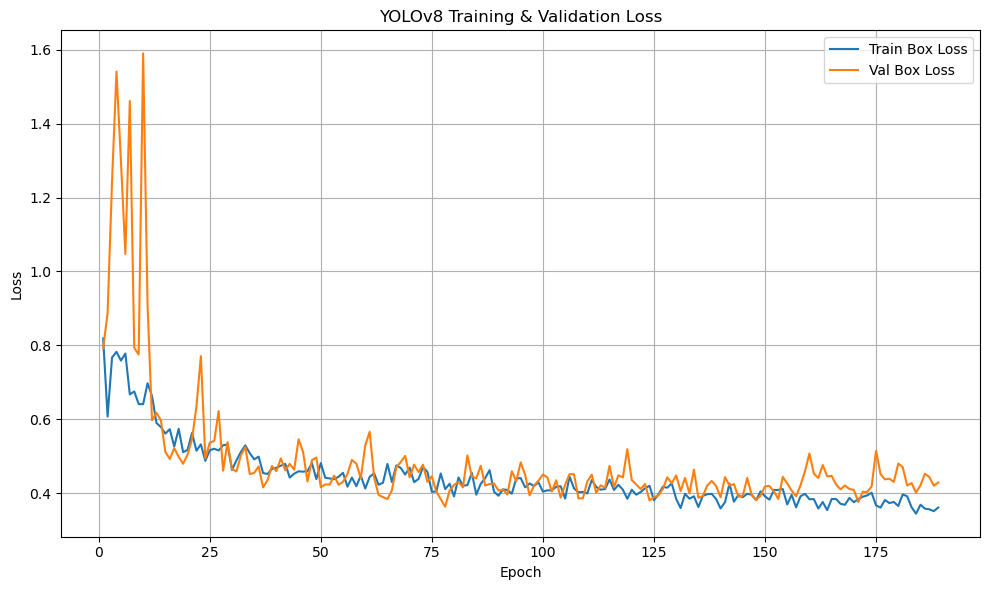

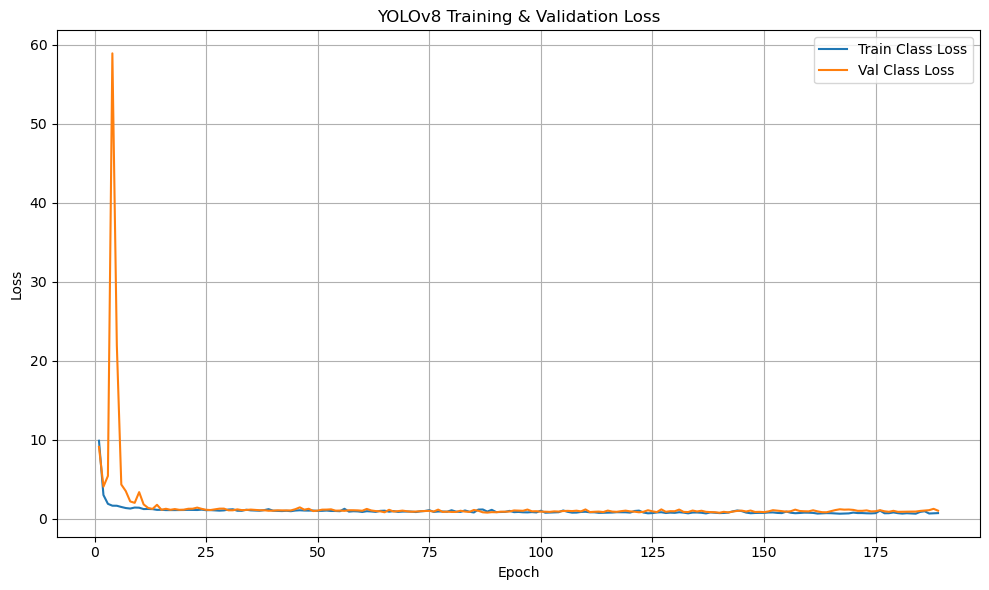

In [36]:
"""Displays the epoch with respect to the box_loss for the training and validation sets"""
df = pd.read_csv("runs/detect/train/results.csv")


plt.figure(figsize=(10, 6)) # Set the figure size
plt.plot(df["epoch"], df["train/box_loss"], label="Train Box Loss") # Plot the training box loss with respect to the epochs
plt.plot(df["epoch"], df["val/box_loss"], label="Val Box Loss") # Plot the validation box loss with respect to the epochs


plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("YOLOv8 Training & Validation Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show() # Plot

"""Displays the epoch with respect to the class_loss for the training and validation sets"""

plt.figure(figsize=(10, 6)) # Set the figure size

plt.plot(df["epoch"], df["train/cls_loss"], label="Train Class Loss") # Plot the training class loss with respect to the epochs
plt.plot(df["epoch"], df["val/cls_loss"], label="Val Class Loss") # Plot the validation class loss with respect to the epochs

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("YOLOv8 Training & Validation Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show() # Plot



image 1/1 /home/sagemaker-user/yolo_split/test/images/71.jpg: 1024x576 1 card, 21.6ms
Speed: 4.7ms preprocess, 21.6ms inference, 1.3ms postprocess per image at shape (1, 3, 1024, 576)

image 1/1 /home/sagemaker-user/yolo_split/test/images/239.jpg: 1024x576 2 cards, 21.1ms
Speed: 7.1ms preprocess, 21.1ms inference, 1.6ms postprocess per image at shape (1, 3, 1024, 576)

image 1/1 /home/sagemaker-user/yolo_split/test/images/14.jpg: 1024x576 1 card, 21.1ms
Speed: 4.8ms preprocess, 21.1ms inference, 1.3ms postprocess per image at shape (1, 3, 1024, 576)

image 1/1 /home/sagemaker-user/yolo_split/test/images/28.jpg: 1024x576 2 cards, 21.1ms
Speed: 5.0ms preprocess, 21.1ms inference, 1.5ms postprocess per image at shape (1, 3, 1024, 576)

image 1/1 /home/sagemaker-user/yolo_split/test/images/288.jpg: 1024x576 2 cards, 21.1ms
Speed: 4.7ms preprocess, 21.1ms inference, 1.5ms postprocess per image at shape (1, 3, 1024, 576)

image 1/1 /home/sagemaker-user/yolo_split/test/images/277.jpg: 1024x5

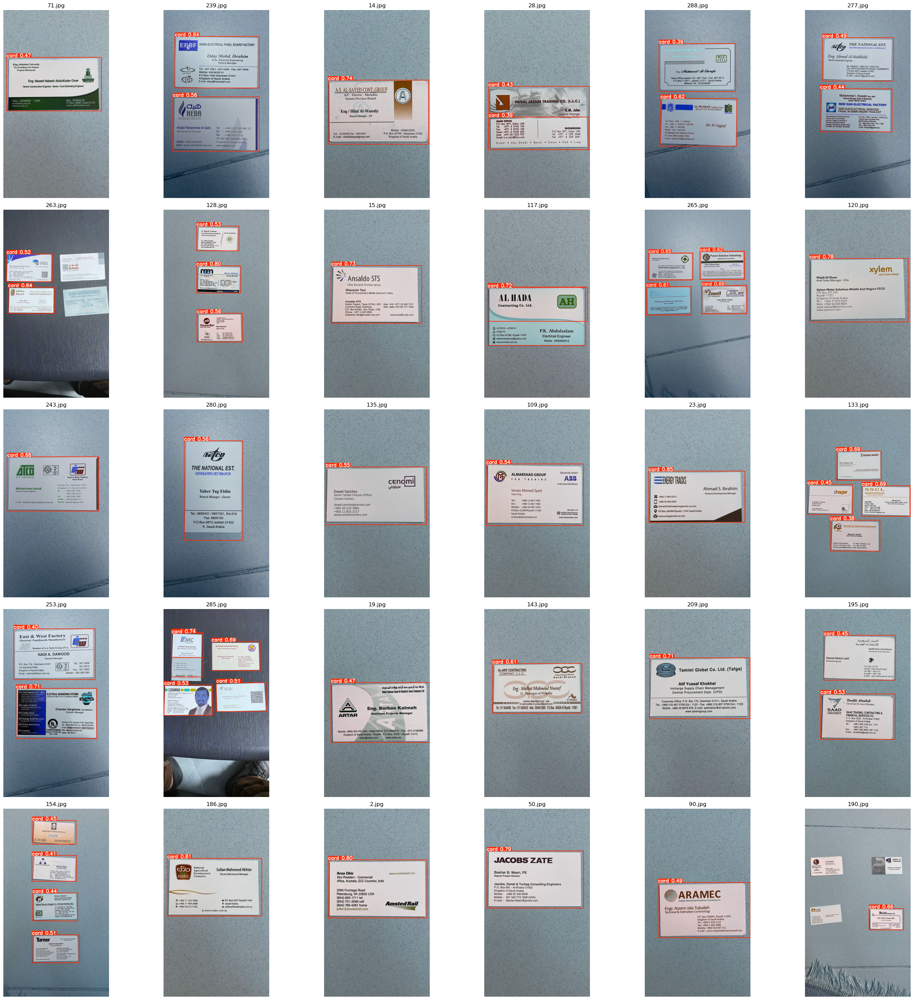

In [6]:
"""Displays the predicted bouding box and the label predicted for the first 5 images of the testing dataset"""
transform = A.Compose([
    A.RandomRotate90(p=0.5),    
    A.Rotate(limit=45, p=0.5),  
    A.RandomSizedBBoxSafeCrop(width=640, height=640, p=0.5), 
    A.HorizontalFlip(p=0.5),  
    A.VerticalFlip(p=0.5),  
    A.RandomBrightnessContrast(p=0.2), 
    A.RandomScale(p=0.2),   
    A.Normalize(),        
])

model = YOLO("runs/detect/train/weights/best.pt") # loads the trained model
model.conf = 0.5
model.iou = 0.3 

image_size = 1024

image_paths = glob.glob("yolo_split/test/images/*.jpg")[:30] # gets the first 5 image file_paths from the testing dataset

plt.figure(figsize=(30,30)) # Adjusts the figure size

i = 1
for img_path in image_paths:
    results = model(img_path, imgsz=image_size) # results predicted from the image
    img = results[0].plot()  # Plots the bouding boxes and the label

    plt.subplot(5, 6, i) # Subplots the image into its position
    i += 1
    plt.imshow(img)
    plt.title(img_path.split("/")[-1])
    plt.axis('off')
plt.tight_layout()
plt.show() # Plots



In [15]:
import os
import shutil

# Define the local path
local_path = './Users/laithhannun/desktop/projects/BCR/best.pt'

# Create the folder if it doesn't exist
os.makedirs(os.path.dirname(local_path), exist_ok=True)

# Now use shutil.copy to copy the model file
shutil.copy(model_path, local_path)

'./Users/laithhannun/desktop/projects/BCR/best.pt'